# **Coupling an Econometric Mixed Linear Model with an Autoregressive Moving Average Using Regional Variables Applied to Water Quality of the Ohio Basin**

# 1. Overview
This research aims to analyze water quality in the Ohio River Basin. To do this, several connected pieces of code will be developed. One of the key components is an econometric model designed to estimate the monthly release of toxic substances into the environment by companies. As part of the process, we will use proportional interpolation to estimate monthly values of Real Gross Domestic Product (Real GDP), based on Industrial Production data, so it can be used as a variable in the model. Using the model’s predictions, a series of maps will be created to visually show how water quality has changed across the region in each quarter of the study period. This will help to provide a clearer understanding of environmental changes in the area over time.

#2. Mixed Linear Model with Autoregressive Moving Average Structure and Random Effects per County and Regional Variables
Useful for making accurate predictions with panel data, our MLM-ARMA model will estimate monthly values for the Toxic Release Inventory using an equation that includes a lagged dependent variable and dummy variables—components that, in other models, would typically need to be excluded or would lead to inconsistent coefficient estimates


[1. Overview](#scrollTo=XE1vBlurtOab)

[2. Mixed Linear Model with Autoregressive Moving Average Structure and Random Effects per County and Regional Variables](#scrollTo=-J32QTdExpP_)

- [2.1 Context: Toxic Release Inventory](#scrollTo=GriAao3U7efx)

- [2.2 Model specification](#scrollTo=3zSVBwOR-hXO)

  - [2.2.1 Setting Everything Up](#scrollTo=aOQaYGkZ-pb2)

  - [2.2.2 Load packages](#scrollTo=GDRvBJXu_0zN)

  - [2.2.3 Load the data](#scrollTo=DcJKv7ZBFvvh)

  - [2.2.4 Checking Regions](#scrollTo=Rkuj8XqgKyJV)

- [2.3 Model Formulation](#scrollTo=B3pS2aLuM3GC)

  - [2.3.1 Predictions](#scrollTo=b3smNsLhdCgv)

[3. Proportional interpolation](#scrollTo=L2hSCdwZsZL8)

- [3.1 Context: Real Gross Domestic Product and Industrial Production Index](#scrollTo=l91JLxHFtPHr)

  - [3.1.1 Data Management](#scrollTo=1oS95FFrwXgB)

  - [3.1.2 Calculation](#scrollTo=v5OZEUeYzJRZ)

  - [3.1.3 Save Output](#scrollTo=TxmoOGlK26-m)

  - [3.1.4 New Predictions](#scrollTo=-6s5x5Yv3XqO)

  - [3.1.5 Pipeline](#scrollTo=GdBAGK4X9k2I)

[4. Maps](#scrollTo=UNbPOA-PDZWF)

- [4.1 Context: Maps of the Ohio River Basin](#scrollTo=WUgJPPQqEyp7)

- [4.2 Map 1 : Load the Data](#scrollTo=YWydwUL0JmmP)

- [4.3 Map 2: Hydrological Subregion Unit](#scrollTo=CHV9Cl902X0r)

  - [4.3.1 Load the data](#scrollTo=g5b0xebF4DkB)

- [4.4 Map 3: Comparative Map](#scrollTo=P-M9wcVI612f)

  - [4.4.1 Load the Data](#scrollTo=hC_voDwY8czx)

  - [4.4.2 Map Aesthetics](#scrollTo=Zo6c9lr_9jWQ)

  - [4.4.3 Map Configuration and Plotting](#scrollTo=9ehEutBS_-u2)

[5. Conclusion](#scrollTo=WpbTGehdpw4H)

[6. References](#scrollTo=07NK3TY5Nf1h)

##2.1 Context: Toxic Release Inventory
We have a main dataset covering the years 2001 to 2023, which includes counties across the entire United States that report any Toxic Release Inventory (TRI) data. A key characteristic of these counties is the presence of some type of industry. For this research, we are specifically focusing on the Mining, Quarrying, and Oil and Gas Extraction sector, identified as Industry 21 according to the NAICS classification. And on the Non-Durable Goods Manufacturing, identified as Industry 311-316, 322-326 according to the NAICS classification.

Each county is evaluated based on variables such as its region (registered with dummy variables), the number of facilities located within it, and the county’s Real Gross Domestic Product (Real GDP) specific to that particular industry. All of the variables will be transformed to logarithms..
**Note: You can read more in section 2 of the document.**

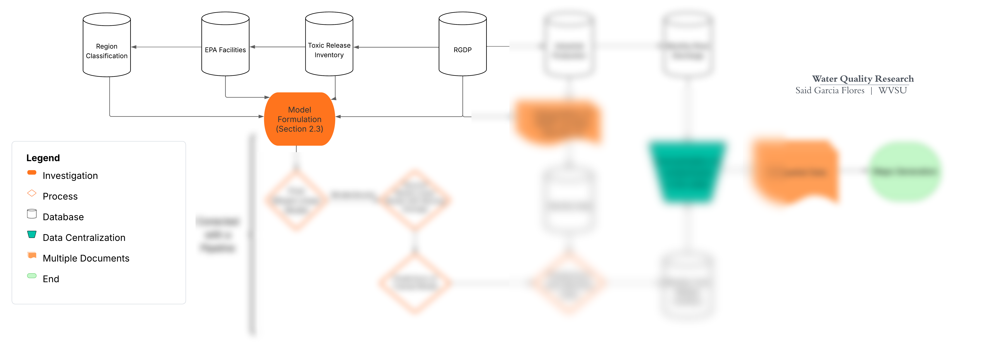

##2.2 Model specification



###2.2.1 Setting Everything Up
Before writing any code, go to your terminal and install the following libraries using pip. We will be using all of these libraries throughout the entire project.



In [ ]:
pip install pandas numpy statsmodels geopandas  matplotlib contextily shapely cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 66.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 50.4 MB/s eta 0:00:00


###2.2.2 Load packages
Before we estimate the model, let's load some packages that we are going to need. When importing a package, it is common to rename it using an abbreviation.

In [ ]:
import pandas as pd  #for data frame processing
import numpy as np  #for some statistical and algebraic procedures
import statsmodels.formula.api as smf  #for building statistics models
from statsmodels.regression.mixed_linear_model import MixedLMResults  #To specify the type of statistical model
import geopandas as gpd  #for geographic data processing
import matplotlib.pyplot as plt  #for creating static, interactive, and animated visualizations
import contextily as ctx  #for adding basemaps
from shapely.geometry import Polygon  #for creating and manipulating geometry shapes
import cartopy.crs as ccrs  #for working with Coordinate Reference System
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER  #to display geographic coordinates

###2.2.3 Load the data
It is time to load the data. We can do that using the piece of code below.

**Note:** We use a CSV document to make the database, but it can be used with any type of data file.

In [ ]:
#Function to load, clean and create of lagged variable for Toxic Release Inventory
def preparing_data(filepath):
  df = pd.read_csv('/content/21 LOGARITMICO_3.csv') #Command to load the data
  df = df.rename(columns={
        'LOG TRI': 'LOG_TRI',
        'LOG RGDP': 'LOG_RGDP',
        'LOG CUANTI': 'LOG_CUANTI'
    })#Command to rename the columns of our database to avoid any kind of misreading
  df['LOGTRI_L1'] = df.groupby('COUNTY')['LOG_TRI'].shift(1) #Creation of the lagged variable by shifting our dependent variable by one year within each county
  df = df.dropna().reset_index(drop=True) #To remove rows with missing values
  print(f"Data after cleaning: {df.shape[0]} observation")
  return df #It returns the dataset prepared for further analysis

###2.2.4 Checking Regions
As the title suggests, we will review the distribution of our dummy variable, the regions, to avoid overloaded or unbalanced regions.

In [ ]:
def check_regions(df):
  region_cols= ['REGION2', 'REGION3', 'REGION4', 'REGION5', 'REGION6', 'REGION7'] #The names of the columns that represent the regions we divided the United States of America
  for col in region_cols:
    if col in df.columns:
      print(f"\nDistribution of {col}:")
      print(df[col].value_counts(dropna=False)) #It accesses the specified column in the DataFrame and returns the frequency of each value, including NaN values.
    else:
      print(f"{col} not found in the DataFrame") #If the column is not found, it prints this message so we can modify it in the dataframe or eliminate the region.

##2.3 Model Formulation
We need an equation to be able to proceed with our model. We define that:
**lnTRIᵢₜ = 𝛿_2 + 𝛿_3 + 𝛿_4 + 𝛿_5 + 𝛿_6 + 𝛿_7 + lnTRI_i,t-1 + lnRGDPᵢₜ + lnCUANTIᵢₜ + εᵢₜ**

Where:

* lnTRIᵢₜ, represents the toxic release inventory for county i at time t.
* lnRGDPᵢₜ, is the Real Gross Domestic Product per county i at time t.
* lnCUANTIᵢₜ, is the number of facilities registered by the EPA per county i at time t.
* lnTRI_i,t-1, represents the lagged value of the toxic release inventory for past emissions impact per county i at time t.
* 𝛿 represents the regional variable (𝛿_2 = MidAtlantic, 𝛿_3 = The Southeast, 𝛿_4 = The Midwest, 𝛿_5 = The Rocky Mountains, 𝛿_6 = The Southwest, and 𝛿_7 = The Pacific Coast).

 **Note: You can read more in section 3 of the document.**


In [ ]:
#First model calculation to obtain the moving average (MA)
def fit_initial_model(df):
    print("\nAjusting model...")
    required_vars = ['LOG_TRI', 'LOG_RGDP', 'LOG_CUANTI', 'LOGTRI_L1',
                    'REGION3', 'REGION4', 'ROC', 'REGION6', 'REGION7'] # The variables of our equation need it for the model calculation.
    missing_vars = [var for var in required_vars if var not in df.columns]
    if missing_vars:
        raise ValueError(f"Missing Variables: {missing_vars}") #We check if they are present in the memory; in a negative case, we receive a message.
    model = smf.mixedlm(
        "LOG_TRI ~ LOG_RGDP + LOG_CUANTI + LOGTRI_L1 + REGION3 + REGION2 + REGION4 + ROC + REGION6 + REGION7 + 0",
        data=df,
        groups=df['COUNTY']
    ) #Command using the alias  of the econometric mixed linear model used (smf.mixedlm) and the variable on the right side following the logic of the equation
    result = model.fit()
    print("Initial Model made")
    return result #we have in result variable the coefficients of our econometric model

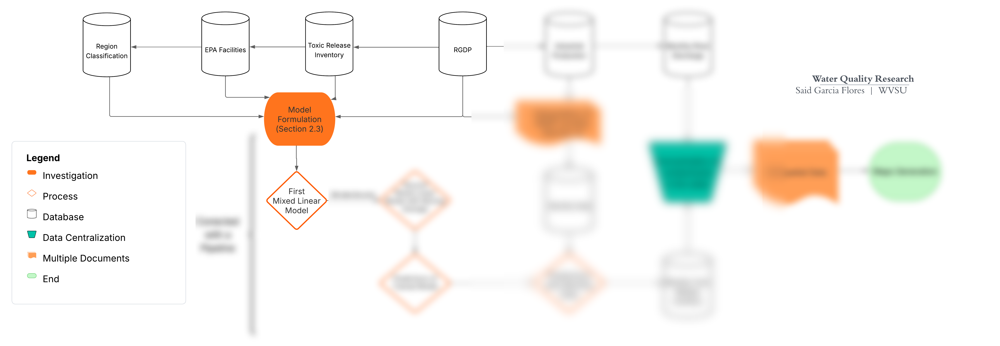

Initially, we estimate a mixed linear model. Subsequently, the residuals from this model are included in a second specification, following the same structure but incorporating a one-period lag of the residuals at the county level.

In [ ]:
def fit_final_model(df,initial_result):
  print("\nPreparing final model...")
  df['error'] = initial_result.resid #We take the residuals of the first model calculation, and we name it error.
  df['error_lag1'] = df.groupby('COUNTY')['error'].shift(1) #We create a one-period lag of the residuals within each county.
  df = df.dropna().reset_index(drop=True) # We remove the rows with missing values resulting from the lagging operation.
  model = smf.mixedlm(
        "LOG_TRI ~ LOG_RGDP + LOG_CUANTI + LOGTRI_L1 + "
        "REGION2 + REGION3 + REGION4 + ROC + REGION6 + REGION7 + error_lag1 + 0",
        data=df,
        groups=df['COUNTY']
    ) #The same formula as above, but with the lagged variable of the residuals.
  result = model.fit()
  return result #we have in return the coefficients of our final model

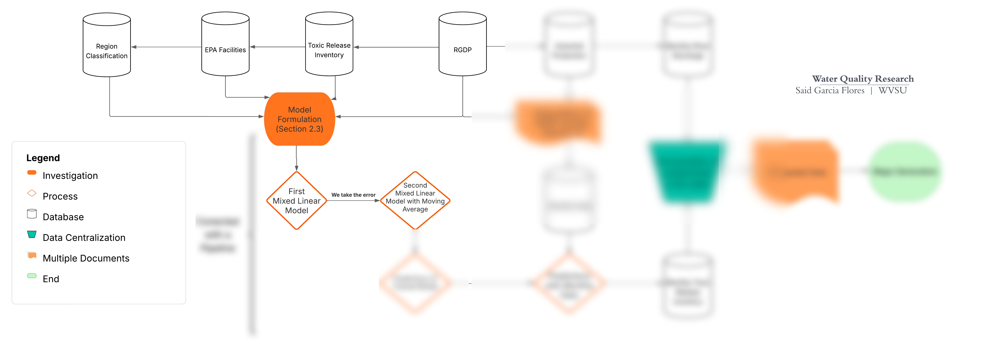

###2.3.1 Predictions
We will generate two types of predictions. The first one is using the original dataset (used during training) to evaluate the accuracy of the model, and the second one is using a different dataset with new values for the variables in order to make fresh predictions.

**Note: You can read more in section 4 of the document.**


In [ ]:
def generate_predictions(df,final_result):
   print("\Generating predictions...") #We have 2 forms of predictions caused by our model: predictions based on fixed effects and the other with random effects.
   df['pred_fijos'] = final_result.predict(exog=df) #We calculate the fixed values by our model.
   try:
        df['pred_completa'] = final_result.predict(df, re_formula=None) #With a try block, we check if our code can compute the full predictions = fixed effects + random effects.
   except: #Some models require a big process of calculation, so if there is  any problem with the line code above, we need to make the process manually.
        random_effects = pd.DataFrame(final_result.random_effects).T #We access to our random effects by county of our mixed linear model.
        county_effects = random_effects.reindex(df['COUNTY']).values #We reorder the random effects by county.
        df['pred_completa'] = df['pred_fijos'] + county_effects.sum(axis=1) #Finally, we add the county effects and the fixed values.
        return df

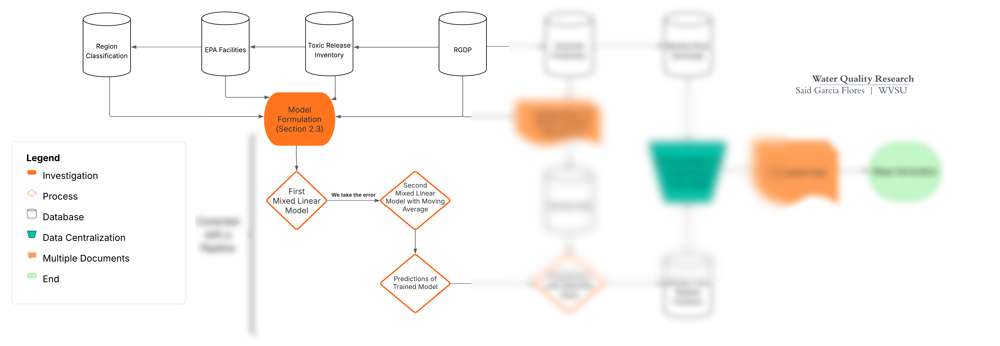

#3. Proportional interpolation
There are certain types of data that are provided on an annual basis or over longer periods; however for practical purposes, these need to be adjusted to a shorter period.  
Proportional interpolation is a method used to estimate values for sub-periods (e.g., months) based on data available for larger periods (e.g., years or quarters). It distributes the known total proportionally using an auxiliary variable that varies more frequently.

##3.1 Context: Real Gross Domestic Product and Industrial Production Index
As mentioned in the previous section, we need a new dataset in order to make monthly predictions of the Toxic Release Inventory. To do this, we will apply proportional interpolation to our independent variable, which is also only available annually: the Real Gross Domestic Product (RGDP).
For the interpolation, we will use the Industrial Production Index for the specific industry we are analyzing—in our case, the Mining, Quarrying, and Oil and Gas Extraction sector and the Nondurable Manufacturing sector. We will also need the annual RGDP values by county used in our main dataset.

**Note: You can read more in section 5 of the document.**

###3.1.1 Data Management
It is time to write and load the data. We can do this using the code below:

**NOTE:** We use a CSV file and also we write the values of RGDP. This last step can be changed to any type of datafile you want.

In [ ]:
#In the annual variable, we write the values of RGDP per county for the years we are studying. As maybe you remember, our dataset is from 2001-2023.
anual =  pd.Series({
2001: 6024743,
2002: 6641518,
2003: 6798483,
2004:7060826,
2005:6282100,
2006:6497749,
2007:6868496,
2008:6187743,
2009:6201317,
2010:5291379,
2011:4890276,
2012:4402893,
2013:4106676,
2014:4330535,
2015:4797219,
2016:5669199,
2017:5885782,
2018: 6918553,
2019:6363465,
2020: 5950912,
2021:6231407,
2022:6546918,
2023:6400203

})
monthly_data = pd.read_csv('/content/IPMINE.csv') #Command to load the data of the  Industrial Production Index, which is reported monthly by the Federal Reserve System (FED)

###3.1.2 Calculation
The justification for applying this interpolation is that, in addition to the Industrial Production Index being available on a monthly basis, it is also a strong indicator of RGDP movements. This is because the index is a key component in the calculation of our independent variable used in the model.

In [ ]:
monthly_data['date'] = pd.to_datetime(monthly_data['date'])  #Converts the date column of the monthly data into a determined format.
monthly_data['year'] = monthly_data['date'].dt.year  #Extracts the year from each date in the column we are interested in.
sum_per_year = monthly_data.groupby('year')['value'].sum() #Groups the data by year and sums the values from the column named values.
proportional_factor = anual / sum_per_year  #Calculates a proportional factor.
monthly_data['interpolated value'] = monthly_data.apply(
    lambda row: row['value'] * proportional_factor[row['year']], axis=1
) # It applies proportional interpolation to each row of the monthly data.
print(monthly_data[['date', 'interpolated value']])

          date  interpolated value
0   2001-01-01       499882.111974
1   2001-02-01       506035.625710
2   2001-03-01       506786.534652
3   2001-04-01       508310.438092
4   2001-05-01       508737.226561
..         ...                 ...
287 2024-12-01                 NaN
288 2025-01-01                 NaN
289 2025-02-01                 NaN
290 2025-03-01                 NaN
291 2025-04-01                 NaN

[292 rows x 2 columns]


###3.1.3 Save Output
We can save our output using the code below

In [ ]:
monthly_data.to_csv('/content/lll - Copy.csv')

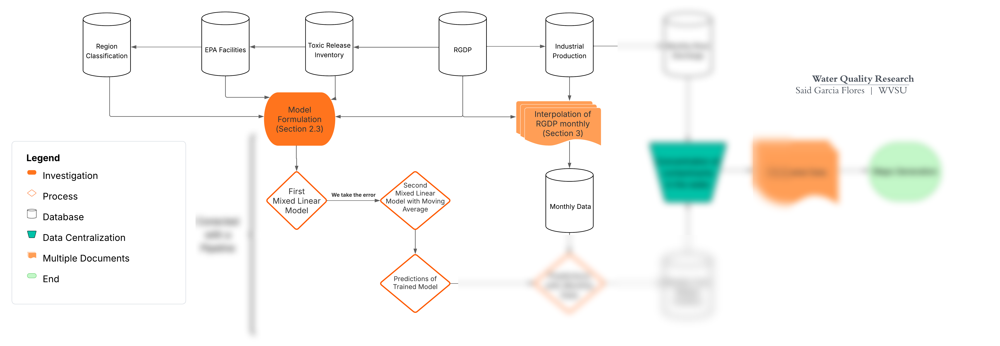

###3.1.4 New Predictions
We will create a new dataset incorporating the monthly RGDP values instead of the yearly ones, maintaining the same format as the main dataset. This means the data will be evaluated too based on the number of facilities and the region they belong to.

In [ ]:
def predict_from_csv(model_result, train_df, new_data_path):
  try:
    new_data = pd.read_csv('/content/AYAY.csv')  #We load the new dataframe with the new values.
    if 'LOG_RGDP' not in new_data.columns: #We check if our main variable is in the data.
      raise ValueError("The 'LOG_RGDP' column is not present in the new data.")
    required_vars = {
        #We check that all our other variables are presented in the values. It is important to say that we manage for the lagged value of the Toxic Release Inventory and the error, the values from the trained value.
        'LOG_TRI':0,
        'LOG_RGDP':0,
        'LOG_CUANTI':0,
        'LOGTRI_L1': train_df['LOG_TRI'].mean(), #You can change if you want.
        'REGION3':0,
        'REGION4':0,
        'ROC':0,
        'REGION6':0,
        'REGION7':0,
        'error_lag1':train_df['error'].mean() #You can change if you want to.
        }
    print(new_data.columns.tolist()) #Shows the data columns of the new dataframe.
    try:
      predictions= model_result.predict(exog = new_data)  #Generate predictions of the trained model to the new file.
      new_data['LOG_TRI_pred'] = predictions #Creates a new column called LOG_TRI_pred with the values made.
      print("\Predictions made")
      return new_data
    except Exception as predict_error: #It shows error if any can't happen.
      print('Check all variables of the model.')
      print(model_result.model.exog_names)
      return None
  except Exception as e:
    print(f"Error loading new data: {e}")
    return None

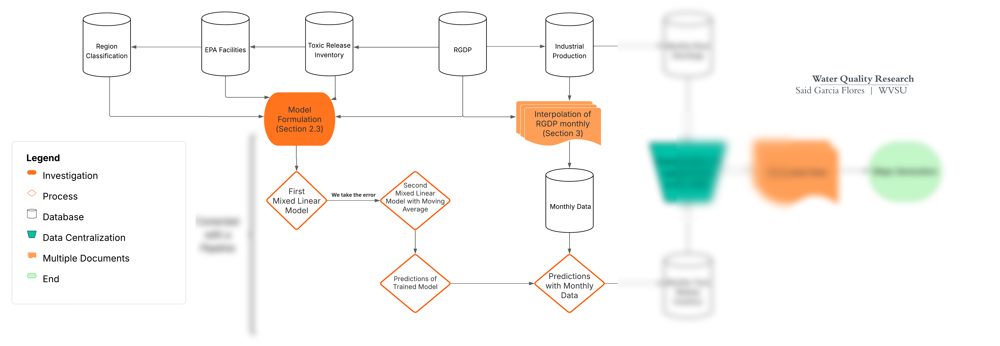

###3.1.5 Pipeline
It's time to run all our functions through the pipeline in order to observe both the coefficients of our econometric model and the final outcome of our predictions.

In [ ]:
#Pipeline
def main():
  try:
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 1000)  #It adjusts the ways it can display the Dataframe.
    filepath = preparing_data('/content/21 LOGARITMICO_3.csv') #We call our first function.
    df = preparing_data(filepath)
    check_regions(df) #We call our second function.
    initial_result = fit_initial_model(df) #We call our third function.
    print(initial_result.summary()) # We print the coefficients of the first econometric model.
    final_result = fit_final_model(df, initial_result)#We call our fourth function.
    print("\n" + "="*80)
    print("RESULTADOS FINALES DEL MODELO ARMA(1,1) CON EFECTOS ALEATORIOS")
    print("="*80)#Lines of code to give style to the presentation.
    print(final_result.summary()) #We print the coefficients of the final econometric model.
    print("\Variance of random effects per COUNTY:") #We print the variance per county.
    print(final_result.random_effects)
    df = generate_predictions(df, final_result) #We call our fifth function.
    df.to_csv('/content/lll.csv', index=False) #We save the predictions of the trained model.
    print ('Predictions saved')
    new_data_path = '/content/AYAY.csv'
    new_predictions = predict_from_csv(model_result=final_result, new_data_path= new_data_path,train_df=df) #We call our sixth model.
    print('Predictions for new data')
    output_path = '/content/lll - Copy (2).csv' #We save the predictions from this new dataset.
    new_predictions.to_csv(output_path, index=False)
    print(f'New predictions saved to {output_path}')
  except Exception as e:
    print(f"An error occurred: {e}")
    print('Check your data.') # An error message appears if any problem happens in the process.
if __name__ == "__main__":
  main()


Datos después de limpieza: 675 observaciones
Datos después de limpieza: 675 observaciones

Distribution of REGION2:
REGION2
0    659
1     16
Name: count, dtype: int64

Distribution of REGION3:
REGION3
0    560
1    115
Name: count, dtype: int64

Distribution of REGION4:
REGION4
0    598
1     77
Name: count, dtype: int64
REGION5 not found in the DataFrame

Distribution of REGION6:
REGION6
0    397
1    278
Name: count, dtype: int64

Distribution of REGION7:
REGION7
0    653
1     22
Name: count, dtype: int64

Ajusting model...
Initial Model made
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: LOG_TRI  
No. Observations: 675     Method:             REML     
No. Groups:       39      Scale:              0.3973   
Min. group size:  2       Log-Likelihood:     -713.8558
Max. group size:  22      Converged:          Yes      
Mean group size:  17.3                                 
-------------------------------------------------------
        

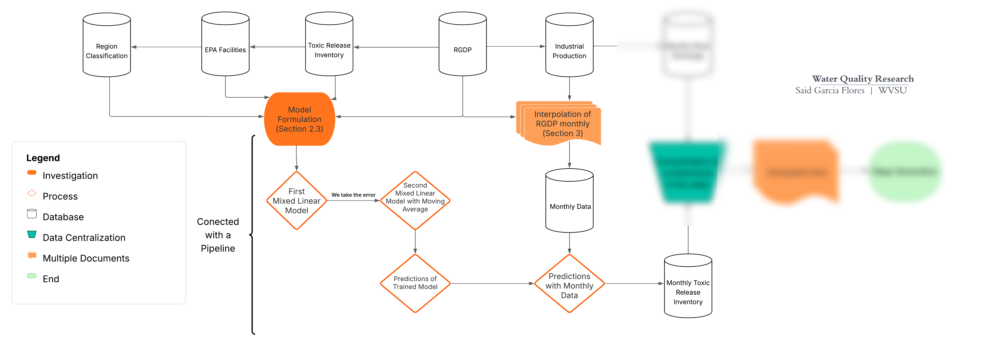

#4. Maps
In geospatial analysis, data plays a critical role. There are many types of geospatial data files, including GeoJSON, Shapefiles, and even CSV files that contain geographic coordinates.

****Note: You can read more in section 6 of the document.**

##4.1 Context: Maps of the Ohio River Basin
As the title suggests, our research focuses on the Ohio River Basin. In this context, we will gather various documents containing information about location, TRI (Toxic Release Inventory) levels, concentration rates, subregions, and other relevant factors.

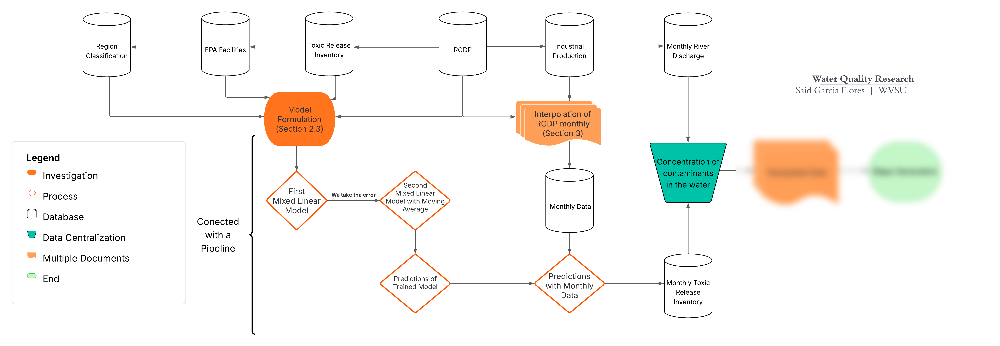

##4.2 Map 1 : Load the Data
First of all, we will  show the location of the Ohio River Basin. To load the data we can use the piece of code below.

In [ ]:
ohio_basin = gpd.read_file("/content/1.6mejorado.geojson") #Command to load the data with geographic info of the Ohio River Basin.
usa = gpd.read_file("https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip") #Zip file that contains different geodata from all countries.
usa = usa[usa['SOVEREIGNT'] == 'United States of America'] #In the database there is a column called "SOVEREIGNT" and we select the United States of America data.
ohio_basin = ohio_basin.to_crs(epsg=3857) #We change the CRS (Coordinate Reference System) of the file.
usa = usa.to_crs(epsg=3857) #we also change the CRS of the file.

We created a boundary box to focus on the continental United States territory.

In [ ]:
continental_bbox = Polygon([ #Coordinate list that excludes Alaska and Hawaii.
    [-125, 24],
    [-125, 50],
    [-66, 50],
    [-66, 24],
    [-125, 24]
])
continental_bbox = gpd.GeoSeries([continental_bbox], crs="EPSG:4326").to_crs(epsg=3857)[0] #We change the CRS of the boundary box.
continental_usa = usa.geometry.intersection(continental_bbox) #We connect the boundary box to the file of USA.

We create and save  the figure of our map

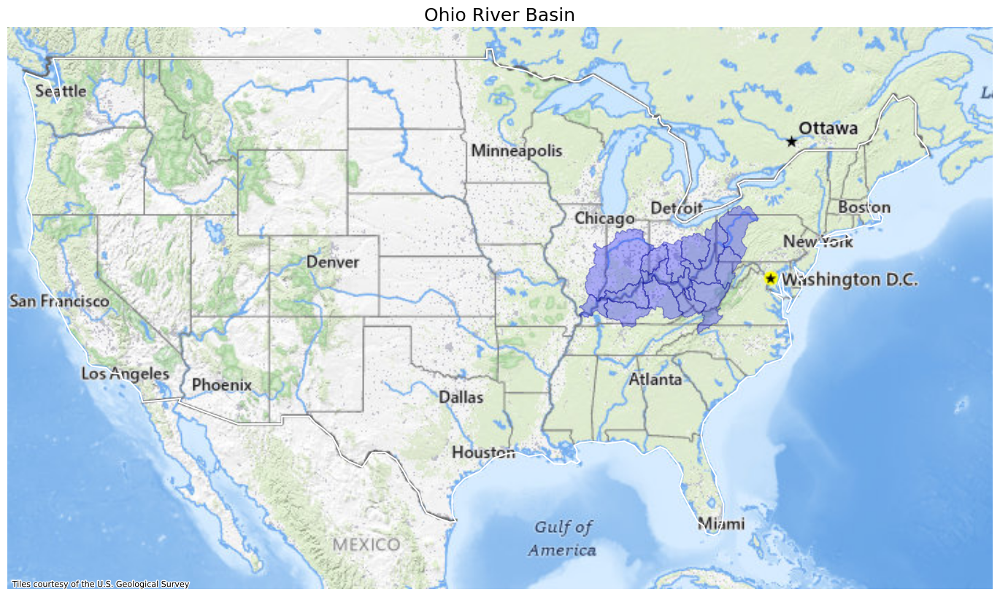

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10)) #We create a figure of 15 inches in width and 10 inches in height.
gpd.GeoSeries(continental_usa).plot(ax=ax, color="none", edgecolor="white", linewidth=1.5) # We chose a fill color, a border color, and the border thickness of the USA layer.
ohio_basin.plot(ax=ax, color="blue", alpha=0.3, edgecolor="darkblue", linewidth=1) #We chose a fill color, a border color, and the border thickness of the Ohio River Basin layer.
ctx.add_basemap(ax, source=ctx.providers.USGS.USTopo) #We pick a base map of the ctx catalogue.
ax.set_title("Ohio River Basin", fontsize=18) # We chose a name.
ax.axis("off")
ax.set_xlim([-1.4e7, -7e6])
ax.set_ylim([2.5e6, 6.5e6])
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.9) #We adjust the map.
plt.savefig("mapa.png", dpi=700, bbox_inches="tight") # We save the map as a high-resolution PNG.
plt.show()


##4.3 Map 2: Hydrological Subregion Unit
Our objective is to assess water quality by analyzing the concentration levels of pollutants, specifically using data from the Toxic Release Inventory (TRI), in relation to water quantity. To achieve this, we selected the rivers with the most available data and their corresponding drainage area delineations, which align with the hydrologic subregions that divide the Ohio River Basin.

###4.3.1 Load the data
It is time to present the structure of the hydrological subregions within the Ohio River Basin. To do so, we need to load the dataset, which contains that information, using the code below.

In [ ]:
data = gpd.read_file("/content/1.6mejorado.geojson")
huc4_ohio = data.to_crs(epsg=3857) #We change the CRS.

We create the figure and we save our map

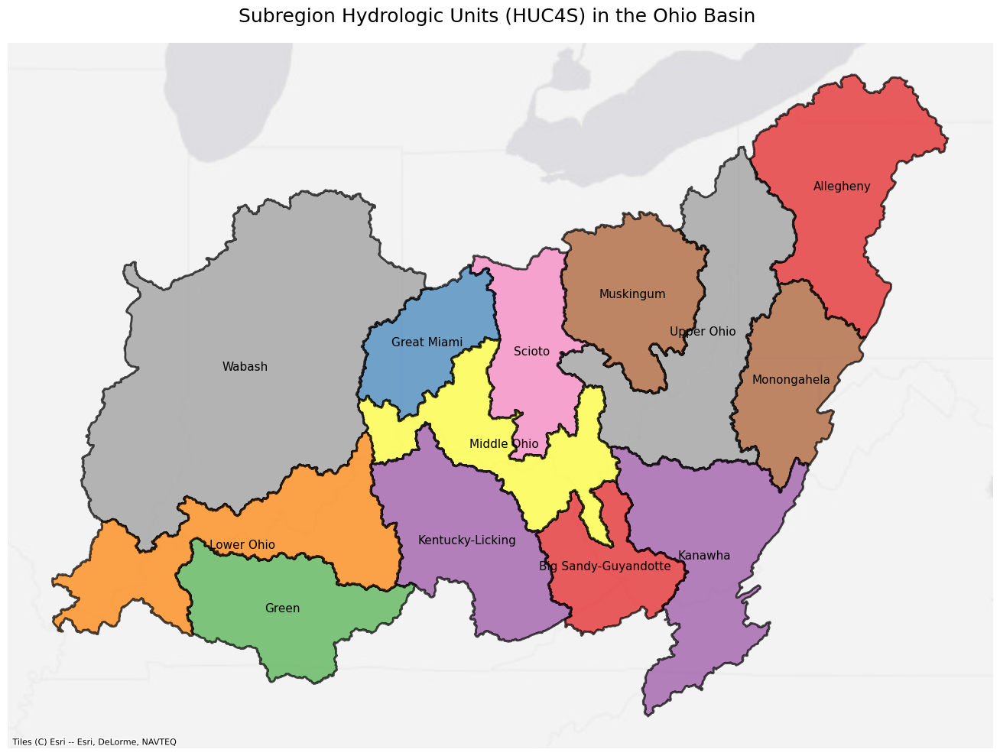

In [ ]:
fix, ax = plt.subplots(figsize=(15,10)) #We create a figure of 15 inches in width and 10 inches in height.
huc4_ohio.plot(   #We illustrate the geodata
    ax=ax,
    column="NAME", #Divides the Ohio Basin based on the column NAME (the name of the hydrological subregion).
    cmap="Set1", #Uses this type of colormap.
    edgecolor="black", #Draw borders for each region.
    linewidth=2, #Border thickness.
    alpha=0.7,#Transparency.
    legend=False)
for idx, row in huc4_ohio.iterrows(): #We want to show the label for each subregion.
    centroid = row.geometry.centroid
    ax.text(
        centroid.x,
        centroid.y,
        row["NAME"], #The column that has the name of the subregions.
        fontsize=11, #Size of the name.
        color="black", #Color of the words.
        ha="center", #Position.
        va="center",
        bbox=dict(
            facecolor="none",
            alpha=0.7,
            edgecolor="none",
            pad=1)    )
ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldGrayCanvas,
    alpha=0.7  ) #We pick a basemap for the ctx catalogue.
ax.set_title("Subregion Hydrologic Units (HUC4S) in the Ohio Basin ", fontsize=18, pad=20) #We add a title for our map.
ax.axis("off")
plt.tight_layout()
plt.savefig("bicho.png", dpi=700, bbox_inches="tight") #We save our maps in a high-resolution PNG.
plt.show()


##4.4 Map 3: Comparative Map
To conclude, we aim to present, through our map, a comparison of the quarterly trends from 2018 to 2023 in the growth rate of our water quality measure, the concentration rate, across the different hydrological subregions that make up the Ohio River Basin.

###4.4.1 Load the Data
Now, we present the data we have prepared. We load three datasets: one containing information on the hydrological subregions and their associated concentration rates, and two shapefiles showing the river networks across the Ohio River Basin.

In [ ]:
data = gpd.read_file("/content/1.6mejorado.geojson")
shapefile1 = gpd.read_file("/content/2.zip")
shapefile2 = gpd.read_file("/content/3.zip")
data = data.to_crs(epsg=4326) #We change the CRS to ensure all datasets align correctly.
shapefile1 = shapefile1.to_crs(epsg=4326)
shapefile2 = shapefile2.to_crs(epsg=4326)


###4.4.2 Map Aesthetics
We apply styling to the map, including gridlines.


In [ ]:
style_shape1 = {'facecolor': 'none', 'edgecolor': 'blue', 'linewidth': 1.2}
style_shape2 = {'facecolor': 'none', 'edgecolor': 'blue', 'linewidth': 1.2, 'linestyle': '--'} #Styles definition.
#Function to add gridlines.
def setup_map(ax, title):
    gl = ax.gridlines(
        draw_labels=True, #Draw the gridlines.
        linewidth=0.5, #Gridline width.
        color='gray', #Color.
        alpha=0.5, #Transparency.
        linestyle='--') #Style.
    gl.top_labels = False   #Disable the labels on the top and right edges of the map.
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER #Format the gridlines with longitude and latitude coordinates.
    gl.yformatter = LATITUDE_FORMATTER
    ax.set_title(title, pad=15)
    return ax

###4.4.3 Map Configuration and Plotting
To analyze the quarterly trends from 2018 to 2023, we generate four maps using the following approach.

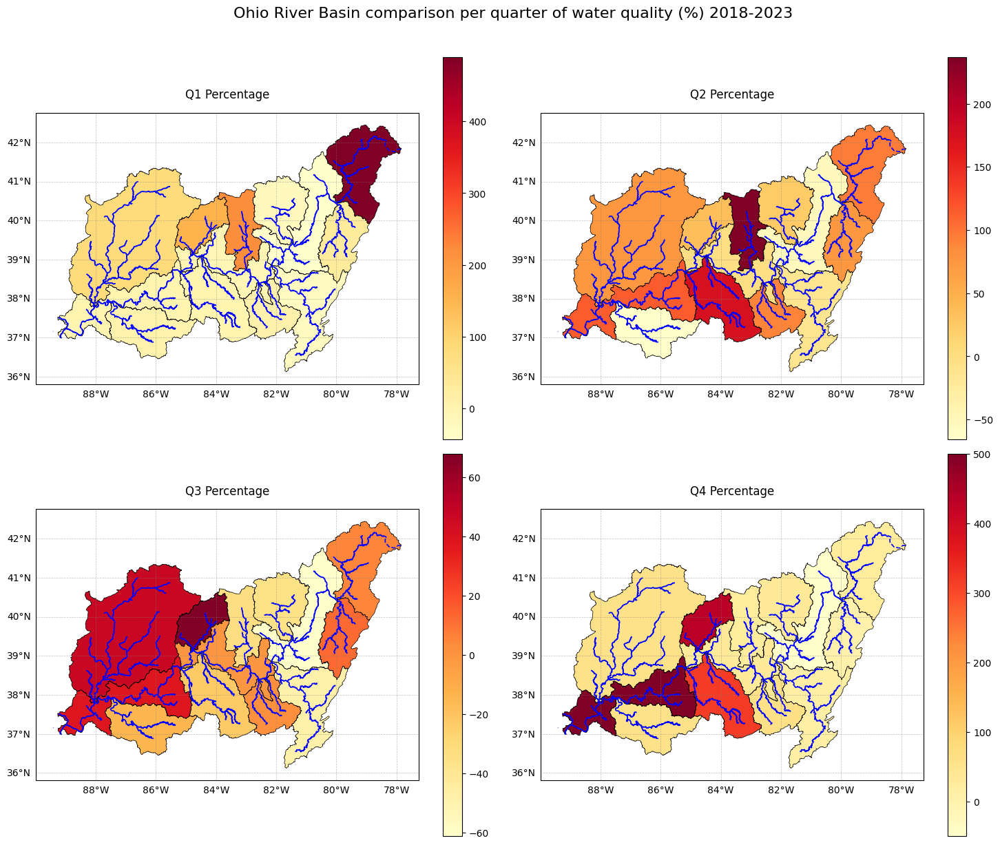

In [ ]:
fig, axes = plt.subplots(
    2, 2,  #Create 4 subplots, 2 figures on the right, and 2 on the left.
    figsize=(15, 12),  #Size of the figure.
    subplot_kw={'projection': ccrs.PlateCarree()}  #Style of projection.
)
#We write the title.
fig.suptitle(
    "Ohio River Basin comparison per quarter of water quality (%) 2018-2023",
    fontsize=16, #Size.
    y=1.02 #Position.
)
for ax, col, title in zip(
    axes.flat,
    ["q1 Comparacion", "q2 Comparacion", "q3 Comparacion", "q4 Comparacion"],
    ["Q1 Percentage", "Q2 Percentage", "Q3 Percentage", "Q4 Percentage"]): #We renamed the columns with the data.
    data.plot(
        column=col, #Use the specified column to graph.
        cmap="YlOrRd", #Colormap.
        legend=True, #Show a color legend for interpretation.
        ax=ax,
        edgecolor='black', #Color of the borders
        linewidth=0.5 #Thin borders
    )
    shapefile1.plot(ax=ax, **style_shape1)
    shapefile2.plot(ax=ax, **style_shape2)#We plot both shapefiles above the 4 maps
    setup_map(ax, title)
plt.tight_layout()
plt.savefig(
    "map_comparacion_quaterly.png",
    dpi=700,
    bbox_inches='tight'
) #We save our map as a high-resolution PNG
plt.show()

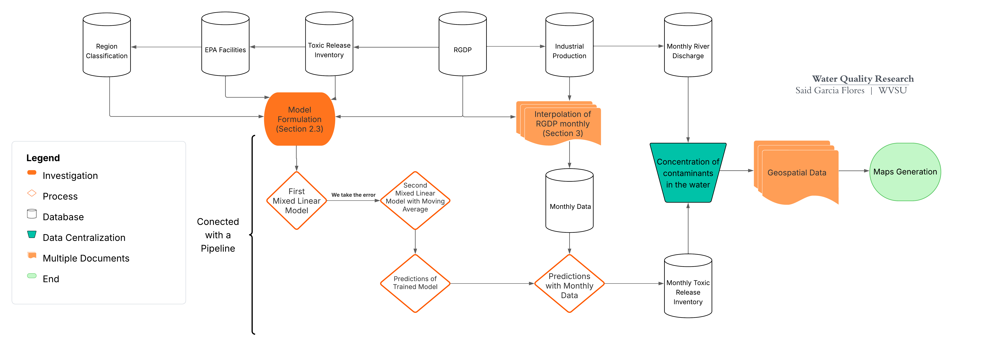

#5. Conclusion
You have reached the final stage of the project, where you can see the final results.
We developed an econometric model that shows the elasticity impact of the Real Gross Domestic Product and regional variables on pollution.
Ultimately, we can observe the trend in water quality in the Ohio River Basin, where many areas have improved their conditions, while others have worsened.
These changes are mainly due to the rise of new industries such as oil and gas, and more importantly, due to lower water levels in the rivers, as shown by the variations across different quarters.

#6. References
https://www.epa.gov/toxics-release-inventory-tri-program

https://www.bea.gov/data/gdp/gdp-county-metro-and-other-areas

https://fred.stlouisfed.org/series/IPMINE
